### YouTube 10s evaluation report (results0117)

This notebook summarizes the **6 YouTube 10-second clips** you generated under:

- `/home/hoyso/projects/AudioTokenization/eval/youtube_10s/wav_16k/`

and compares **GT vs reconstructions** for these run directories:

- `default_PLE_25hz_vq16384` (eval: `eval_youtube_10s`, tau from `dtp_stats_ft/summary.json`)
- `default_PLE_50hz_vq16384` (eval: `eval_youtube_10s`, tau from `dtp_stats_ft/summary.json`)
- `default_fixedpattern_50hz_vq65536` (eval: `eval_youtube_10s`, no tau override)
- `default_random_50hz_vq16384` (PLE) (eval: `eval_youtube_10s_ple`, tau from `dtp_stats_ple_ft/summary.json`)

It prints:

- overall metrics (`metrics.json`)
- per-sample metrics (each eval output `manifest.jsonl`)
- spectrograms and inline audio players



In [1]:
from __future__ import annotations

import json
from dataclasses import dataclass
from pathlib import Path
from typing import Dict, List, Optional

import matplotlib.pyplot as plt
import numpy as np
import torch
import torchaudio
from IPython.display import Audio, display

# Optional but recommended for nicer tables.
try:
    import pandas as pd
except ImportError as e:
    raise RuntimeError("Please install pandas in your env (e.g., `pip install pandas`).") from e

REPO_ROOT = Path("/home/hoyso/projects/AudioTokenization").resolve()
CLIP_WAV_DIR = REPO_ROOT / "eval" / "youtube_10s" / "wav_16k"
CLIP_MANIFEST = REPO_ROOT / "eval" / "youtube_10s" / "manifest.jsonl"

RESULTS_ROOT = REPO_ROOT / "results" / "results0117"

EVALS: Dict[str, Path] = {
    "PLE_25hz_vq16384": RESULTS_ROOT / "default_PLE_25hz_vq16384" / "eval_youtube_10s",
    "PLE_50hz_vq16384": RESULTS_ROOT / "default_PLE_50hz_vq16384" / "eval_youtube_10s",
    "FixedPattern_50hz_vq65536": RESULTS_ROOT / "default_fixedpattern_50hz_vq65536" / "eval_youtube_10s",
    "Random_50hz_vq16384__PLE": RESULTS_ROOT / "default_random_50hz_vq16384" / "eval_youtube_10s_ple",
}

assert CLIP_WAV_DIR.is_dir(), f"Missing clip wav dir: {CLIP_WAV_DIR}"
assert CLIP_MANIFEST.is_file(), f"Missing clip manifest: {CLIP_MANIFEST}"

for name, p in EVALS.items():
    assert p.is_dir(), f"Missing eval output dir for {name}: {p}"
    assert (p / "metrics.json").is_file(), f"Missing metrics.json for {name}: {p / 'metrics.json'}"
    assert (p / "manifest.jsonl").is_file(), f"Missing manifest.jsonl for {name}: {p / 'manifest.jsonl'}"

print("OK: paths validated")
print("Clip wav dir:", CLIP_WAV_DIR)
print("Clip manifest:", CLIP_MANIFEST)
print("Eval outputs:")
for k, v in EVALS.items():
    print(" -", k, "->", v)



OK: paths validated
Clip wav dir: /home/hoyso/projects/AudioTokenization/eval/youtube_10s/wav_16k
Clip manifest: /home/hoyso/projects/AudioTokenization/eval/youtube_10s/manifest.jsonl
Eval outputs:
 - PLE_25hz_vq16384 -> /home/hoyso/projects/AudioTokenization/results/results0117/default_PLE_25hz_vq16384/eval_youtube_10s
 - PLE_50hz_vq16384 -> /home/hoyso/projects/AudioTokenization/results/results0117/default_PLE_50hz_vq16384/eval_youtube_10s
 - FixedPattern_50hz_vq65536 -> /home/hoyso/projects/AudioTokenization/results/results0117/default_fixedpattern_50hz_vq65536/eval_youtube_10s
 - Random_50hz_vq16384__PLE -> /home/hoyso/projects/AudioTokenization/results/results0117/default_random_50hz_vq16384/eval_youtube_10s_ple


In [2]:
def read_json(path: Path) -> dict:
    with path.open("r") as f:
        return json.load(f)


def read_jsonl(path: Path) -> List[dict]:
    with path.open("r") as f:
        return [json.loads(line) for line in f if line.strip()]


# Overall (corpus-level) metrics per run
rows = []
for name, out_dir in EVALS.items():
    m = read_json(out_dir / "metrics.json")
    rows.append(
        {
            "run": name,
            "count": m.get("count"),
            "stoi": m.get("stoi"),
            "pesq_wb": m.get("pesq_wb"),
            "pesq_nb": m.get("pesq_nb"),
            "si_snr": m.get("si_snr"),
            "si_sdr": m.get("si_sdr"),
            "speaker_similarity": m.get("speaker_similarity"),
            "mcd": m.get("mcd"),
            "wer": m.get("wer"),
            "wer_sentence_avg": m.get("wer_sentence_avg"),
            "utmos": m.get("utmos"),
            "codebook_perplexity": m.get("codebook_perplexity"),
            "codebook_utilization": m.get("codebook_utilization"),
            "avg_sim": m.get("avg_sim"),
            "cfg_overrides": ", ".join(m.get("cfg_overrides") or []),
        }
    )

df_overall = pd.DataFrame(rows).set_index("run")
display(df_overall)



,count,stoi,pesq_wb,pesq_nb,si_snr,si_sdr,speaker_similarity,mcd,wer,wer_sentence_avg,utmos,codebook_perplexity,codebook_utilization,avg_sim,cfg_overrides
run,,,,,,,,,,,,,,,
PLE_25hz_vq16384,6,0.555893,1.463466,2.109105,-17.349847,-17.349800,0.400956,6.764964,None,None,2.097922,913.647461,0.061768,None,model.resampler.dtp_params.fixed_tau=0.372
PLE_50hz_vq16384,6,0.635643,1.644166,2.354156,-12.635563,-12.681088,0.606239,5.405117,None,None,2.104570,2003.082886,0.135559,None,model.resampler.dtp_params.fixed_tau=0.217
FixedPattern_50hz_vq65536,6,0.656186,1.542448,2.317265,-15.588121,-15.640591,0.536860,5.482865,None,None,2.064217,2531.756104,0.041031,None,
Random_50hz_vq16384__PLE,6,0.635944,1.601138,2.316202,-14.039795,-14.037266,0.529877,5.537540,None,None,2.126979,1880.582153,0.122925,None,model.resampler.dtp_params.fixed_tau=0.154


In [3]:
@dataclass(frozen=True)
class Clip:
    filename: str
    url: str
    start: str
    start_seconds: int
    title: str
    youtube_id: str
    wav_16k_path: Path


def resolve_manifest_path(path_str: str) -> Path:
    p = Path(path_str)
    if p.is_absolute():
        return p
    # Manifest stores some paths as repo-relative (e.g., "eval/youtube_10s/..."),
    # so resolve them against REPO_ROOT (not notebook CWD).
    return (REPO_ROOT / p).resolve()


clips_raw = read_jsonl(CLIP_MANIFEST)
clips: List[Clip] = []
for r in clips_raw:
    wav_path = resolve_manifest_path(str(r["clip_wav_16k"]))

    # Extra safety: if something still resolved oddly, fall back to CLIP_WAV_DIR/<filename>.
    if not wav_path.is_file():
        candidate = CLIP_WAV_DIR / Path(str(r["clip_wav_16k"])) .name
        if candidate.is_file():
            wav_path = candidate.resolve()

    clips.append(
        Clip(
            filename=wav_path.name,
            url=r["url"],
            start=r["start"],
            start_seconds=int(r["start_seconds"]),
            title=r["title"],
            youtube_id=r["youtube_id"],
            wav_16k_path=wav_path,
        )
    )

clips.sort(key=lambda c: c.filename)
print("clips:", len(clips))
for c in clips:
    print(" -", c.filename)


def load_wav_mono_16k(path: Path) -> torch.Tensor:
    wav, sr = torchaudio.load(str(path))
    if wav.dim() == 2 and wav.size(0) > 1:
        wav = wav[:1, :]
    if sr != 16000:
        wav = torchaudio.functional.resample(wav, sr, 16000)
    return wav


def to_spectrogram_db(wav_mono_16k: torch.Tensor, n_fft: int = 1024, hop_length: int = 256) -> torch.Tensor:
    spec = torchaudio.transforms.Spectrogram(n_fft=n_fft, hop_length=hop_length, power=2.0)(wav_mono_16k)
    spec_db = torchaudio.transforms.AmplitudeToDB(stype="power")(spec)
    # spec_db shape: (1, freq, time)
    return spec_db.squeeze(0)


def plot_specs(
    title: str,
    items: List[tuple[str, Path]],
    vmax_db: Optional[float] = None,
    vmin_db: Optional[float] = None,
) -> None:
    specs = []
    for label, p in items:
        wav = load_wav_mono_16k(p)
        specs.append((label, to_spectrogram_db(wav)))

    n = len(specs)
    fig, axes = plt.subplots(1, n, figsize=(4.2 * n, 3.6), constrained_layout=True)
    if n == 1:
        axes = [axes]

    all_vals = torch.cat([s.flatten() for _, s in specs])
    if vmax_db is None:
        vmax_db = float(torch.quantile(all_vals, 0.98).item())
    if vmin_db is None:
        vmin_db = float(torch.quantile(all_vals, 0.02).item())

    for ax, (label, s) in zip(axes, specs):
        img = ax.imshow(s.numpy(), origin="lower", aspect="auto", vmin=vmin_db, vmax=vmax_db, cmap="magma")
        ax.set_title(label)
        ax.set_xlabel("frame")
        ax.set_ylabel("freq bin")
        fig.colorbar(img, ax=ax, fraction=0.046, pad=0.04)

    fig.suptitle(title)
    plt.show()



clips: 6
 - 01__The_Talk_-_Kanye_West_Elon_Musk__9TxtTF_dUHQ__ss-2-05__dur-10.wav
 - 02__Me_at_the_zoo__jNQXAC9IVRw__ss-0__dur-10.wav
 - 03__Ali_G_donald_trump_sacha_baron_Cohen_interview__sP5ElraFHHE__ss-44__dur-10.wav
 - 04__John_Mayer_-_Improvising_a_song_on_Livestream_-_May_10th_2018_Beats1_Interview_Apple_Music__gfHEOL-sDy4__ss-26__dur-10.wav
 - 05__Just_the_Two_of_Us_Bill_Withers_-_Jazz_Piano_Arrangement_With_Sheet_Music_by_Jacob_Koller__g4xoe5Ccuzc__ss-0__dur-10.wav
 - 06__Mike_Dean_-_Making_of_Challenger_Live_via_Stream__YWq_CGT0QPY__ss-1-30__dur-10.wav


file: 01__The_Talk_-_Kanye_West_Elon_Musk__9TxtTF_dUHQ__ss-2-05__dur-10.wav
title: The Talk: Kanye West & Elon Musk\t9TxtTF_dUHQ
url: https://youtu.be/9TxtTF_dUHQ?si=4kPSZ5HNpA5iYxHZ
start: 2:05

Audio:


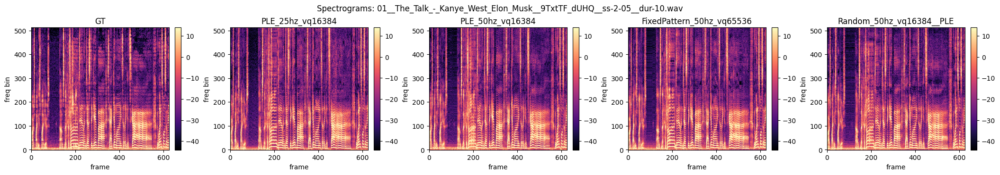

,stoi,pesq_wb,pesq_nb,si_snr,si_sdr,speaker_similarity,mcd,wer,utmos
run,,,,,,,,,
PLE_25hz_vq16384,0.815860,1.971320,2.929542,-7.091257,-7.091251,0.405907,4.276233,None,3.076706
PLE_50hz_vq16384,0.863897,2.340542,3.216072,-5.527037,-5.527068,0.690314,3.231435,None,3.100276
FixedPattern_50hz_vq65536,0.846533,2.048768,3.067505,-19.018101,-19.018204,0.671350,3.717187,None,2.937760
Random_50hz_vq16384__PLE,0.844479,2.136207,3.094701,-7.508804,-7.508791,0.524441,3.541358,None,3.171153


file: 02__Me_at_the_zoo__jNQXAC9IVRw__ss-0__dur-10.wav
title: Me at the zoo\tjNQXAC9IVRw
url: https://youtu.be/jNQXAC9IVRw?si=k7sNX3mM8lYMW3cU
start: 0

Audio:


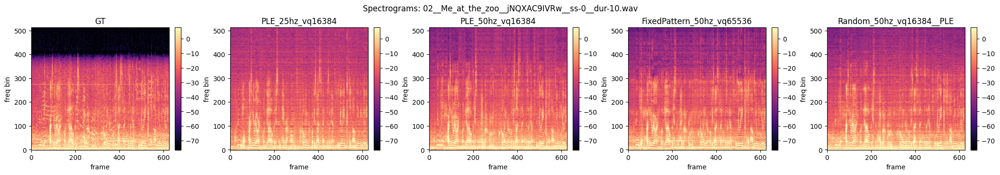

,stoi,pesq_wb,pesq_nb,si_snr,si_sdr,speaker_similarity,mcd,wer,utmos
run,,,,,,,,,
PLE_25hz_vq16384,0.573636,1.199715,1.692134,-12.357342,-12.357169,0.302872,13.065722,None,1.297932
PLE_50hz_vq16384,0.670766,1.358101,1.980972,-2.757066,-2.756925,0.572503,11.600938,None,1.300821
FixedPattern_50hz_vq65536,0.665162,1.337552,2.058828,-5.765857,-5.766825,0.422238,11.340058,None,1.278761
Random_50hz_vq16384__PLE,0.628985,1.334307,1.989132,-25.215153,-25.195580,0.441756,11.350888,None,1.278131


file: 03__Ali_G_donald_trump_sacha_baron_Cohen_interview__sP5ElraFHHE__ss-44__dur-10.wav
title: Ali G donald trump sacha baron Cohen interview\tsP5ElraFHHE
url: https://youtu.be/sP5ElraFHHE?si=1DUetO19MwoFLKW3
start: 44

Audio:


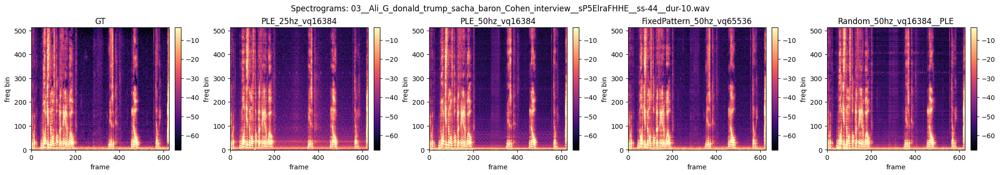

,stoi,pesq_wb,pesq_nb,si_snr,si_sdr,speaker_similarity,mcd,wer,utmos
run,,,,,,,,,
PLE_25hz_vq16384,0.514828,1.854899,2.661726,-10.404948,-10.404950,0.482613,4.993623,None,2.864701
PLE_50hz_vq16384,0.603674,2.251615,3.131175,-1.280017,-1.280023,0.572924,3.755593,None,3.376266
FixedPattern_50hz_vq65536,0.668433,2.207109,3.089543,-15.484923,-15.484926,0.578623,3.479676,None,3.244911
Random_50hz_vq16384__PLE,0.629990,2.084478,3.008509,-4.046765,-4.047011,0.479146,3.656312,None,3.417318


file: 04__John_Mayer_-_Improvising_a_song_on_Livestream_-_May_10th_2018_Beats1_Interview_Apple_Music__gfHEOL-sDy4__ss-26__dur-10.wav
title: John Mayer - Improvising a song on Livestream - May 10th 2018  (Beats1 Interview) Apple Music\tgfHEOL-sDy4
url: https://youtu.be/gfHEOL-sDy4?si=vZAtCdpFv1TrHWjx
start: 26

Audio:


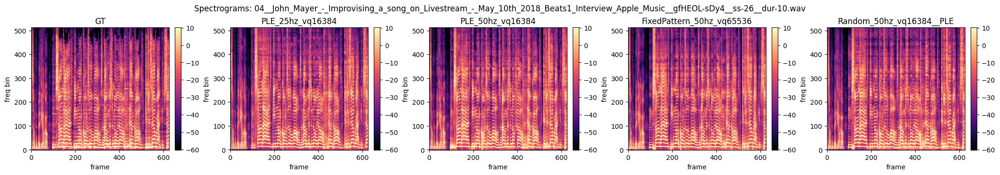

,stoi,pesq_wb,pesq_nb,si_snr,si_sdr,speaker_similarity,mcd,wer,utmos
run,,,,,,,,,
PLE_25hz_vq16384,0.792600,1.575917,2.575534,-3.647720,-3.647721,0.425302,5.688791,None,2.591742
PLE_50hz_vq16384,0.833344,1.699563,2.625065,-1.367105,-1.367117,0.786666,4.495651,None,2.310778
FixedPattern_50hz_vq65536,0.836024,1.477151,2.703230,-3.060954,-3.060954,0.674238,4.686396,None,2.433026
Random_50hz_vq16384__PLE,0.824892,1.742136,2.684144,-5.806051,-5.806050,0.744311,4.444723,None,2.280268


file: 05__Just_the_Two_of_Us_Bill_Withers_-_Jazz_Piano_Arrangement_With_Sheet_Music_by_Jacob_Koller__g4xoe5Ccuzc__ss-0__dur-10.wav
title: “Just the Two of Us” (Bill Withers) - Jazz Piano Arrangement With Sheet Music by Jacob Koller\tg4xoe5Ccuzc
url: https://youtu.be/g4xoe5Ccuzc?si=v9JdeTYoZk-Y5P9P
start: 0

Audio:


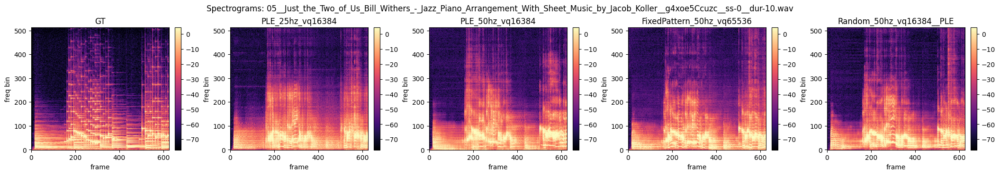

,stoi,pesq_wb,pesq_nb,si_snr,si_sdr,speaker_similarity,mcd,wer,utmos
run,,,,,,,,,
PLE_25hz_vq16384,0.300290,1.104680,1.250287,-44.734116,-44.734123,0.270779,6.847511,None,1.280863
PLE_50hz_vq16384,0.376674,1.121838,1.423082,-53.751137,-53.751923,0.469362,6.115033,None,1.260754
FixedPattern_50hz_vq65536,0.425222,1.128880,1.525542,-24.995325,-24.995325,0.423721,5.811374,None,1.253732
Random_50hz_vq16384__PLE,0.391629,1.217229,1.475389,-27.078854,-27.078850,0.309775,6.639550,None,1.268424


file: 06__Mike_Dean_-_Making_of_Challenger_Live_via_Stream__YWq_CGT0QPY__ss-1-30__dur-10.wav
title: Mike Dean - Making of "Challenger" (Live via Stream)\tYWq_CGT0QPY
url: https://youtu.be/YWq_CGT0QPY?si=G2UmlikXbSM-kzTs
start: 1:30

Audio:


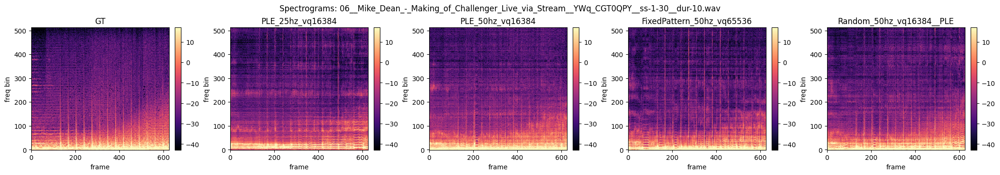

,stoi,pesq_wb,pesq_nb,si_snr,si_sdr,speaker_similarity,mcd,wer,utmos
run,,,,,,,,,
PLE_25hz_vq16384,0.338145,1.074266,1.545409,-25.863701,-25.863583,0.518264,5.717900,None,1.475586
PLE_50hz_vq16384,0.465505,1.093340,1.748570,-11.131019,-11.403476,0.545669,3.232050,None,1.278527
FixedPattern_50hz_vq65536,0.495745,1.055230,1.458939,-25.203564,-25.517309,0.450991,3.862496,None,1.237109
Random_50hz_vq16384__PLE,0.495687,1.092472,1.645339,-14.583141,-14.587312,0.679831,3.592412,None,1.346581


In [4]:
def per_sample_metrics_by_filename(eval_out_dir: Path) -> Dict[str, dict]:
    recs = read_jsonl(eval_out_dir / "manifest.jsonl")
    out: Dict[str, dict] = {}
    for r in recs:
        pred_path = r.get("pred_16k_path")
        if not pred_path:
            continue
        fname = Path(str(pred_path)).name
        out[fname] = r
    return out


PER_SAMPLE: Dict[str, Dict[str, dict]] = {name: per_sample_metrics_by_filename(out_dir) for name, out_dir in EVALS.items()}


def wav_path_for(eval_out_dir: Path, clip_filename: str, kind: str) -> Path:
    # eval/eval.py saves GT/PRED under (gt_16k|pred_16k) / last_k_parts(src.parent, 2) / (stem + .wav)
    # Our src files are in: eval/youtube_10s/wav_16k/<file>.wav
    assert kind in ("gt", "pred")
    base = eval_out_dir / ("gt_16k" if kind == "gt" else "pred_16k")
    return base / "youtube_10s" / "wav_16k" / clip_filename


def show_one_clip(clip: Clip) -> None:
    print("=" * 120)
    print("file:", clip.filename)
    print("title:", clip.title)
    print("url:", clip.url)
    print("start:", clip.start)

    # Audio players
    # NOTE: For file paths, pass via filename=... (positional string is treated as raw audio data).
    print("\nAudio:")
    display(Audio(filename=str(clip.wav_16k_path)))

    for run_name, out_dir in EVALS.items():
        pred_path = wav_path_for(out_dir, clip.filename, kind="pred")
        display(Audio(filename=str(pred_path)))

    # Spectrograms
    spec_items = [("GT", clip.wav_16k_path)]
    for run_name, out_dir in EVALS.items():
        pred_path = wav_path_for(out_dir, clip.filename, kind="pred")
        spec_items.append((run_name, pred_path))

    plot_specs(title=f"Spectrograms: {clip.filename}", items=spec_items)

    # Per-sample metrics table
    metric_rows = []
    for run_name, _ in EVALS.items():
        r = PER_SAMPLE[run_name].get(clip.filename)
        if r is None:
            metric_rows.append({"run": run_name, "missing": True})
            continue

        metric_rows.append(
            {
                "run": run_name,
                "stoi": r.get("stoi"),
                "pesq_wb": r.get("pesq_wb"),
                "pesq_nb": r.get("pesq_nb"),
                "si_snr": r.get("si_snr"),
                "si_sdr": r.get("si_sdr"),
                "speaker_similarity": r.get("speaker_similarity"),
                "mcd": r.get("mcd"),
                "wer": r.get("wer"),
                "utmos": r.get("utmos"),
            }
        )

    df = pd.DataFrame(metric_rows).set_index("run")
    display(df)


for c in clips:
    show_one_clip(c)



### Notes / troubleshooting

- If you see `ImportError: pandas` or `ImportError: matplotlib`, install them in your `speech_eval` environment.
- If you want fewer plots per cell output, replace `for c in clips: show_one_clip(c)` with a single `show_one_clip(clips[0])`.
- The YouTube extraction warning about JS runtime is handled in the runner script by installing nodejs and passing `--js-runtimes node`.

